<a href="https://colab.research.google.com/github/Ankur-singh/GANs/blob/main/notebooks/05_Pix2Pix.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### This notebook is still Work in Progress (WIP)

## Setup

In [1]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

We will be downloading dataset from kaggle. So, we will have to setup it up. Read [this blog](https://www.analyticsvidhya.com/blog/2021/06/how-to-load-kaggle-datasets-directly-into-google-colab/) for setup instructions.

In [11]:
! pip install -q kaggle
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json

mkdir: cannot create directory ‘/root/.kaggle’: File exists


In [12]:
! kaggle datasets download -d ktaebum/anime-sketch-colorization-pair

100% 11.6G/11.6G [04:46<00:00, 56.6MB/s]
100% 11.6G/11.6G [04:46<00:00, 43.6MB/s]


In [13]:
!unzip -q anime-sketch-colorization-pair.zip 

In [14]:
!rm anime-sketch-colorization-pair.zip

In [15]:
!pip install -q segmentation-models-pytorch

We are ready to write code . . . 

In [16]:
import torch
import numpy as np
import torchvision
from torch import nn
from torch.utils.data import Dataset, DataLoader
from torchvision import datasets, transforms
from torch.utils.tensorboard import SummaryWriter
import segmentation_models_pytorch as smp

import time
from PIL import Image
from pathlib import Path
import matplotlib.pyplot as plt
%matplotlib inline

In [17]:
## Config

BS = 32
LR = 1e-4
LAMBDA = 100
IMAGE_SIZE = (256, 2*256)
IN_CHANNELS = 3
OUT_CHANNELS = 3
NUM_EPOCHS = 5

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
DEVICE

'cuda'

In [18]:
ROOT_DIR = Path('data/train')

In [19]:
fns = list(ROOT_DIR.iterdir())
len(fns), fns[0]

(14224, PosixPath('data/train/1933028.png'))

In [20]:
# Sketchs and Colored Image dataset
class AnimeDataset(Dataset):
    def __init__(self,fns,transforms):
        self.fns = fns
        self.transform = transforms
    
    def __len__(self):
        return len(self.fns)
    
    def __getitem__(self, index):
        # read image file
        img_file = self.fns[index]
        image = Image.open(img_file)
        image = self.transform(image)
        # print(image.shape)
        
        # divide image into sketch and colored_img, right is sketch and left is colored image
        colored_img = image[:,:, :image.shape[2]//2]
        sketch = image[:,:, image.shape[2]//2:]
        return sketch, colored_img
    
    
tfms = transforms.Compose([
    transforms.Resize(IMAGE_SIZE),
    transforms.ToTensor(), 
    transforms.Normalize((0.5, ), (0.5, ))
])

dataset = AnimeDataset(fns, tfms)
dataloader = DataLoader(dataset, shuffle=True, batch_size=BS)

In [21]:
xb, yb = next(iter(dataloader))
xb.shape, yb.shape

(torch.Size([32, 3, 256, 256]), torch.Size([32, 3, 256, 256]))

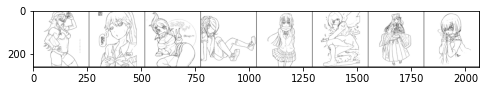

In [22]:
img_grid = torchvision.utils.make_grid(xb[:8], normalize=True)

plt.figure(figsize=(8, 24))
plt.imshow(img_grid.cpu().permute(1, 2, 0).numpy());

## Models

In [23]:
class Discriminator(nn.Module):
    def __init__(self, in_channels=3, out_channels=3):
        super().__init__()
        self.model = nn.Sequential(
            nn.Conv2d(in_channels * 2, 64, kernel_size=4, stride=2, padding=1, padding_mode="reflect"),
            nn.LeakyReLU(0.2),
            nn.Conv2d(64, 128, 4, 2, 1, bias=False, padding_mode="reflect"),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
            nn.Conv2d(128, 256, 4, 2, 1, bias=False, padding_mode="reflect"),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2),
            nn.Conv2d(256, 512, 4, 2, 1, bias=False, padding_mode="reflect"),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2),
            nn.Conv2d(512, 512, 4, 1, 1, bias=False, padding_mode="reflect"),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2),
            nn.Conv2d(512, out_channels, 4, 1, 1, padding_mode="reflect"),
            nn.Sigmoid()
        )

    def forward(self, x, y):
        xy = torch.cat([x, y], dim=1)
        return self.model(xy)

In [24]:
netD = Discriminator(3, 3).to(DEVICE)
netD(xb.to(DEVICE), yb.to(DEVICE)).shape

torch.Size([32, 3, 14, 14])

In [25]:
## Generator model
netG = smp.Unet(
    encoder_name="resnet18",        # choose encoder, e.g. mobilenet_v2 or efficientnet-b7
    encoder_weights="imagenet",     # use `imagenet` pre-trained weights for encoder initialization
    in_channels=IN_CHANNELS,                  # model input channels (1 for gray-scale images, 3 for RGB, etc.)
    classes=OUT_CHANNELS,                      # model output channels (number of classes in your dataset)
    activation='tanh',
).to(DEVICE)

netG(xb.to(DEVICE)).shape

Downloading: "https://download.pytorch.org/models/resnet18-5c106cde.pth" to /root/.cache/torch/hub/checkpoints/resnet18-5c106cde.pth


  0%|          | 0.00/44.7M [00:00<?, ?B/s]

torch.Size([32, 3, 256, 256])

How do one know if models are working as expected? Simple, just generate some random data and pass it through the network. If you don't get any error then you are good. Another important thing that you need to check is the output size. If you are getting something different from what was expected, then you did something wrong.

Perfect, everything looks good. Lets define our loss function and optimizers.

In [26]:
## Loss & Optimizer
bce_loss = nn.BCEWithLogitsLoss()
l1_loss = nn.L1Loss()

opt_dis = torch.optim.Adam(netD.parameters(), lr=LR, betas=(0.5, 0.999))
opt_gen = torch.optim.Adam(netG.parameters(), lr=LR, betas=(0.5, 0.999))

The training process is same as DCGANs but again, we will have to update the `train` function to accomodate for the extra `y` that our models take. 

In [27]:
## Training

def train(num_epochs):

    step = 0
    writer = SummaryWriter(f"logs")

    for epoch in range(NUM_EPOCHS):
        start = time.time()
        for i, (xb, yb) in enumerate(dataloader):
            # Data
            real_xb = xb.to(DEVICE)
            real_yb = yb.to(DEVICE)
            
            fake_yb = netG(real_xb)
            
            # Discriminator
            dis_fake = netD(real_xb, fake_yb.detach()) # important
            dis_real = netD(real_xb, real_yb)

            loss_fake = bce_loss(dis_fake, torch.zeros_like(dis_fake))
            loss_real = bce_loss(dis_real, torch.ones_like(dis_real))
            loss_dis = (loss_fake + loss_real) / 2
            opt_dis.zero_grad()
            loss_dis.backward()
            opt_dis.step()

            # Generator
            dis_fake = netD(real_xb, fake_yb)
            loss_gen = bce_loss(dis_fake, torch.ones_like(dis_fake))
            loss_gen = loss_gen + (l1_loss(fake_yb, real_yb) * LAMBDA)
            opt_gen.zero_grad()
            loss_gen.backward()
            opt_gen.step()

            if i == 0:
                print(
                    f"Epoch [{epoch}/{NUM_EPOCHS}] Batch {i}/{len(dataloader)} \
                        Loss D: {loss_dis:.4f}, loss G: {loss_gen:.4f} | Time :{time.time() - start}"
                )

                with torch.no_grad():
                    sketch, original, generated = real_xb[:8], real_yb[:8], netG(real_xb[:8])
                    data = list(zip(sketch, original, generated))
                    data = torch.stack([image for row in data for image in row])
                    img_grid = torchvision.utils.make_grid(data, normalize=True, nrow=3)

                    writer.add_image(
                        "Sketch | Original | Generated", img_grid, global_step=step
                    )
                    step += 1

In [28]:
## TensorBoard : starting it before training to monitor it in progress
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

In [29]:
train(NUM_EPOCHS)

Epoch [0/5] Batch 0/445                         Loss D: 0.7288, loss G: 85.7267 | Time :4.764421701431274
Epoch [1/5] Batch 0/445                         Loss D: 0.5041, loss G: 16.2776 | Time :1.4149541854858398
Epoch [2/5] Batch 0/445                         Loss D: 0.5037, loss G: 17.3593 | Time :1.4136114120483398
Epoch [3/5] Batch 0/445                         Loss D: 0.5034, loss G: 15.0037 | Time :1.4085891246795654
Epoch [4/5] Batch 0/445                         Loss D: 0.5035, loss G: 12.3973 | Time :1.4087796211242676


In [43]:
def generate(n_samples = 4):
    xb, yb = next(iter(dataloader))
    xb, yb = xb[:n_samples], yb[:n_samples]
    fake = netG(xb.to(DEVICE))
    data = list(zip(xb, yb, fake.cpu()))
    data = torch.stack([image for row in data for image in row])
    img_grid = torchvision.utils.make_grid(data, normalize=True, nrow=3)

    plt.figure(figsize=(10, 28))
    plt.imshow(img_grid.cpu().permute(1, 2, 0).numpy());

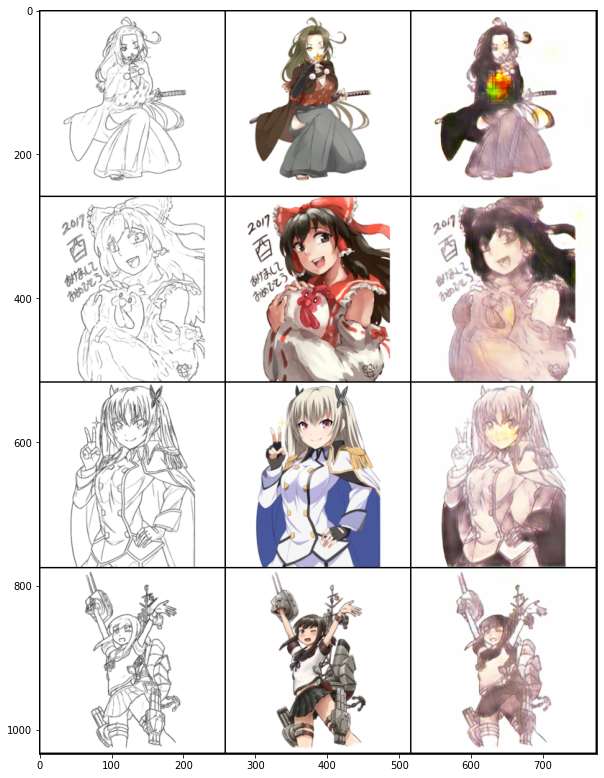

In [44]:
generate()

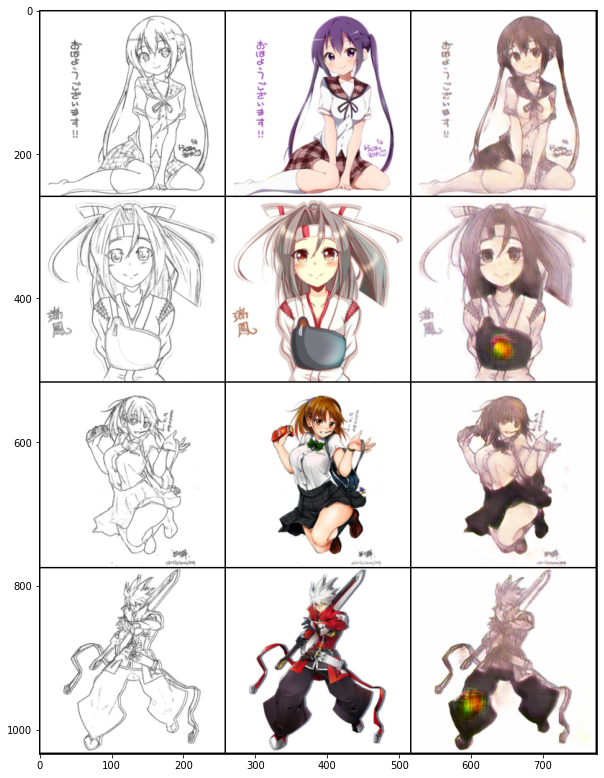

In [45]:
generate()

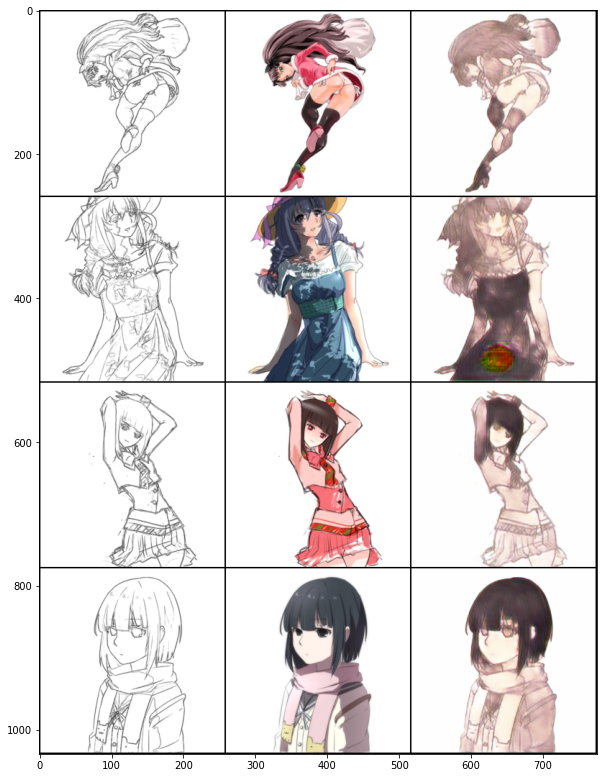

In [46]:
generate()

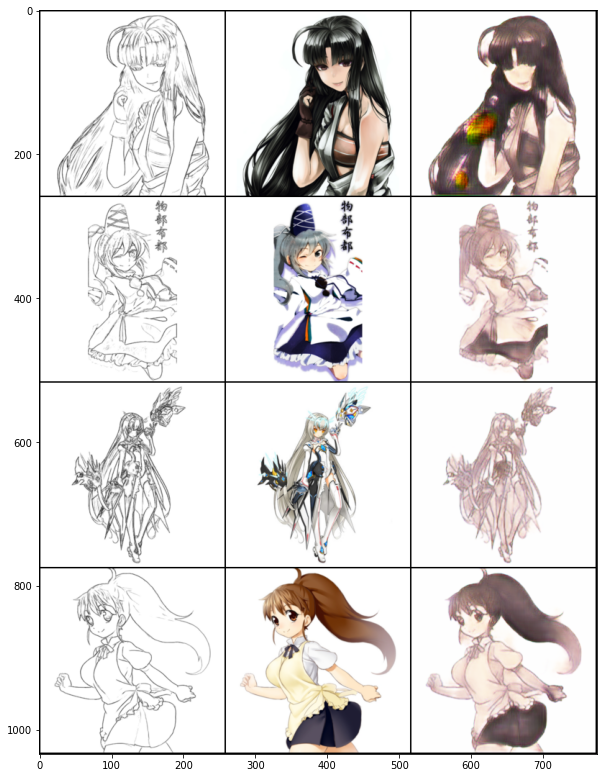

In [47]:
generate()

This is very impressive. In just 5 epochs, its doing a great job. But as you can see, it uses the same color palette. I think it will go away with more rounds of training. 

That is all for this notebook, see you next notebook! The next notebook would be on CycleGANs 😋